In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
data = pd.read_csv("/kaggle/input/life-expectancy-who/Life Expectancy Data.csv")

In [4]:
data.shape

(2938, 22)

In [5]:
data.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [7]:
data["Country"].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', "Côte d'Ivoire", 'Cabo Verde',
       'Cambodia', 'Cameroon', 'Canada', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czechia', "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
       'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia',
       'Georgia', 'Germany'

In [8]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data["Status"] = le.fit_transform(data["Status"])
data["Country"] = le.fit_transform(data["Country"])
print(data["Country"],data["Status"])

0         0
1         0
2         0
3         0
4         0
       ... 
2933    192
2934    192
2935    192
2936    192
2937    192
Name: Country, Length: 2938, dtype: int64 0       1
1       1
2       1
3       1
4       1
       ..
2933    1
2934    1
2935    1
2936    1
2937    1
Name: Status, Length: 2938, dtype: int64


**normalization**

In [9]:
# from sklearn.preprocessing import StandardScaler,MinMaxScaler
# norm = MinMaxScaler()
# data.dropna(axis=1,inplace = True)
# norm_data = norm.fit_transform(data)
# data = pd.DataFrame(norm_data,columns = data.columns)
# data

In [10]:
data.corr()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Country,1.000000,0.001342,-0.031635,-0.016763,0.039802,-0.030528,-0.062134,-0.032983,-0.020741,-0.024593,...,0.017807,0.055374,-0.006138,0.090206,-0.016841,-0.016669,0.008049,0.022687,-0.024503,-0.026167
Year,0.001342,1.000000,0.001864,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,...,0.094158,0.090740,0.134337,-0.139741,0.101620,0.016969,-0.047876,-0.050929,0.243468,0.209400
Status,-0.031635,0.001864,1.000000,-0.482136,0.315284,0.112252,-0.596660,-0.454261,-0.115317,0.076955,...,-0.220250,-0.299990,-0.216913,0.148590,-0.478339,0.045801,0.368389,0.366751,-0.478402,-0.514045
Life expectancy,-0.016763,0.170033,-0.482136,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,...,0.465556,0.218086,0.479495,-0.556556,0.461455,-0.021538,-0.477183,-0.471584,0.724776,0.751975
Adult Mortality,0.039802,-0.079052,0.315284,-0.696359,1.000000,0.078756,-0.195848,-0.242860,-0.162476,0.031176,...,-0.274823,-0.115281,-0.275131,0.523821,-0.296049,-0.013647,0.302904,0.308457,-0.457626,-0.454612
infant deaths,-0.030528,-0.037415,0.112252,-0.196557,0.078756,1.000000,-0.115638,-0.085612,-0.223566,0.501128,...,-0.170689,-0.128616,-0.175171,0.025231,-0.108427,0.556801,0.465711,0.471350,-0.145139,-0.193720
Alcohol,-0.062134,-0.052990,-0.596660,0.404877,-0.195848,-0.115638,1.000000,0.341285,0.087549,-0.051827,...,0.221734,0.296942,0.222020,-0.048845,0.354712,-0.035252,-0.428795,-0.417414,0.450040,0.547378
percentage expenditure,-0.032983,0.031400,-0.454261,0.381864,-0.242860,-0.085612,0.341285,1.000000,0.016274,-0.056596,...,0.147259,0.174420,0.143624,-0.097857,0.899373,-0.025662,-0.251369,-0.252905,0.381952,0.389687
Hepatitis B,-0.020741,0.104333,-0.115317,0.256762,-0.162476,-0.223566,0.087549,0.016274,1.000000,-0.120529,...,0.486171,0.058280,0.611495,-0.112675,0.083903,-0.123321,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.024593,-0.082493,0.076955,-0.157586,0.031176,0.501128,-0.051827,-0.056596,-0.120529,1.000000,...,-0.136166,-0.106241,-0.141882,0.030899,-0.076466,0.265966,0.224808,0.221072,-0.129568,-0.137225


In [11]:
data.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

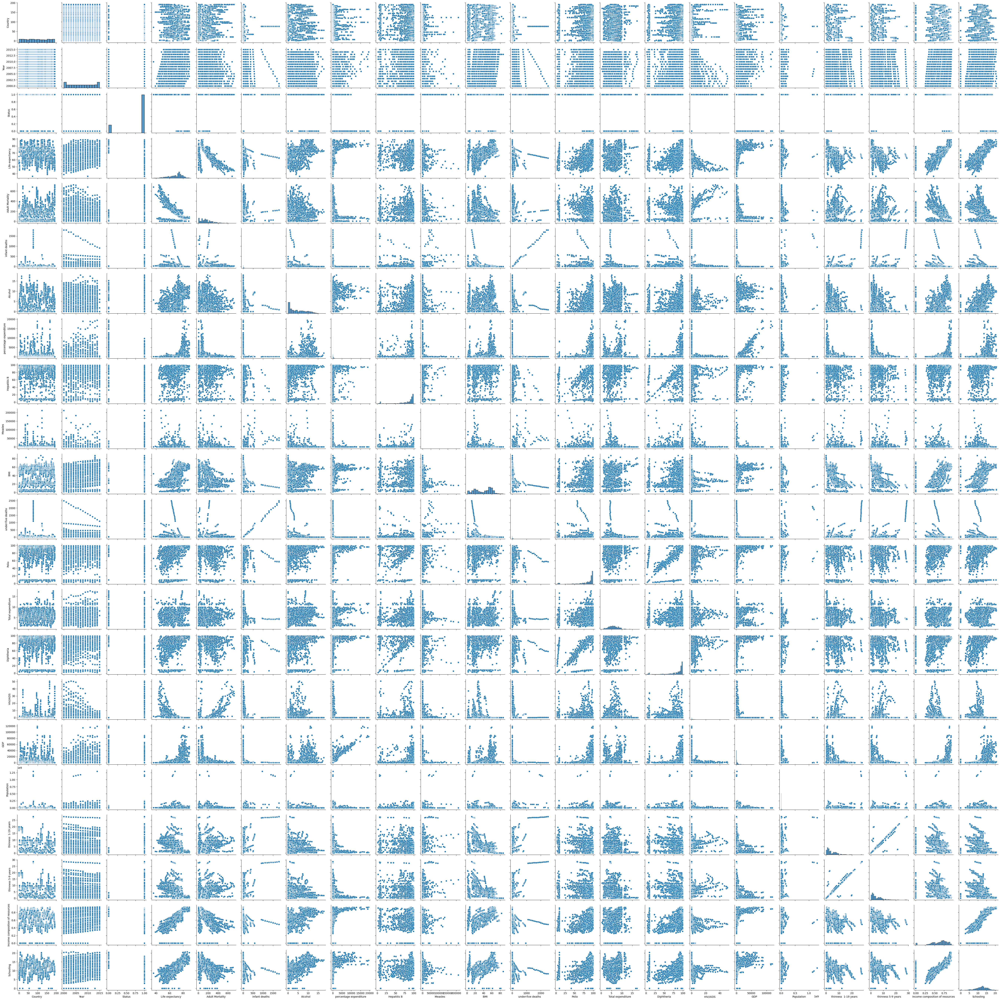

In [12]:
sns.pairplot(data,diag_kind = "hist")

**IMPUTATION OF NULL VALUES**

In [13]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values = np.nan,strategy = 'median')
ag = imp.fit_transform(data)
d = pd.DataFrame(ag)

In [14]:
d.isnull().sum()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
19    0
20    0
21    0
dtype: int64

<AxesSubplot:>

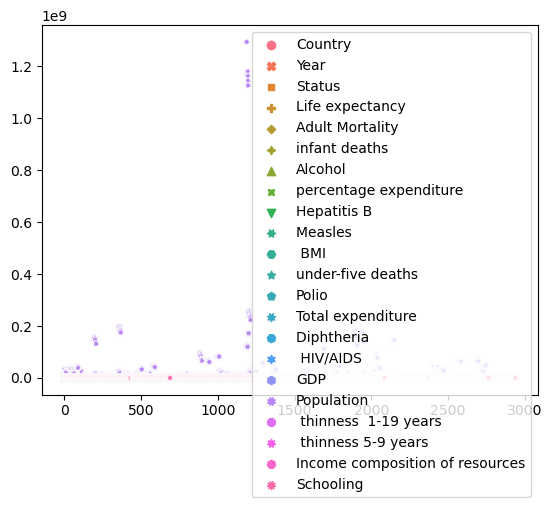

In [15]:
import seaborn as sns
sns.scatterplot(data)

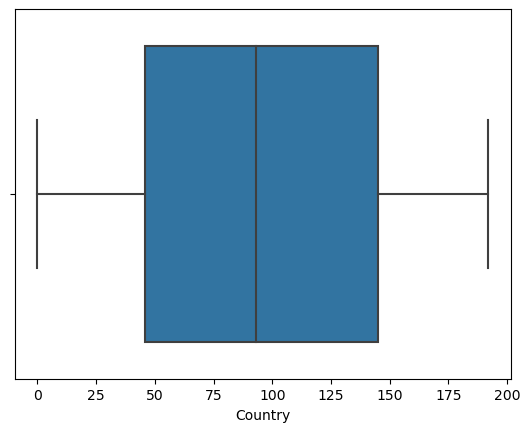

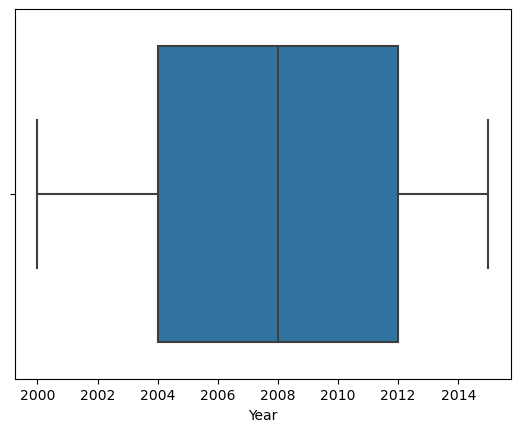

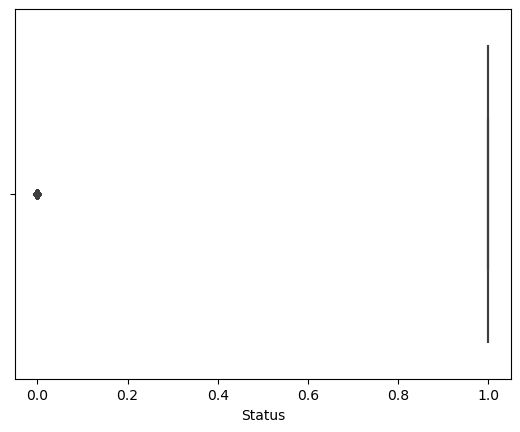

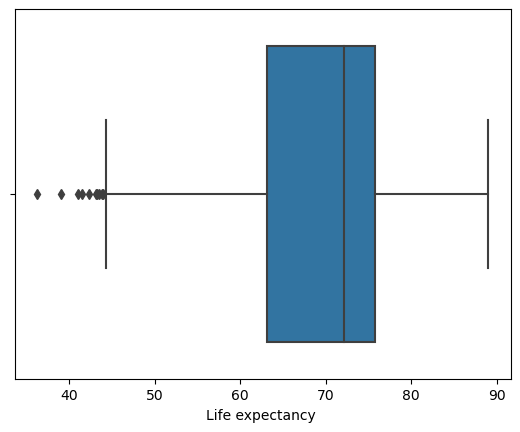

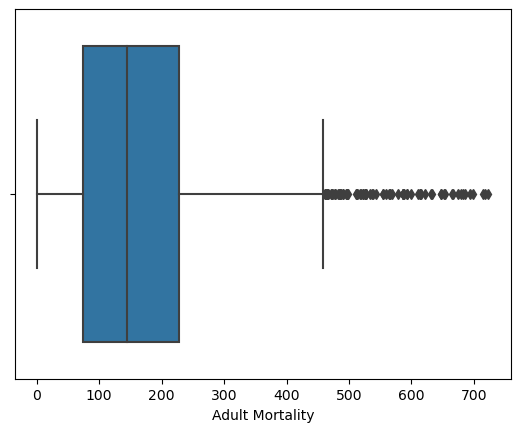

...

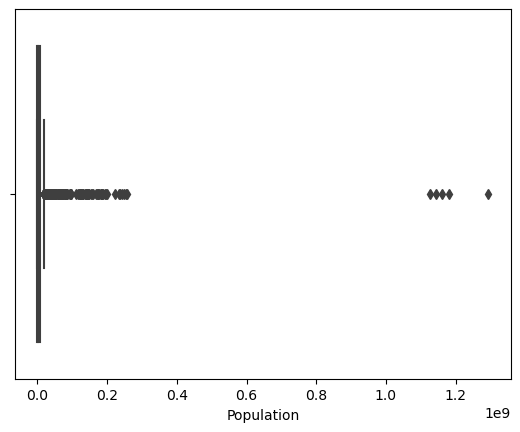

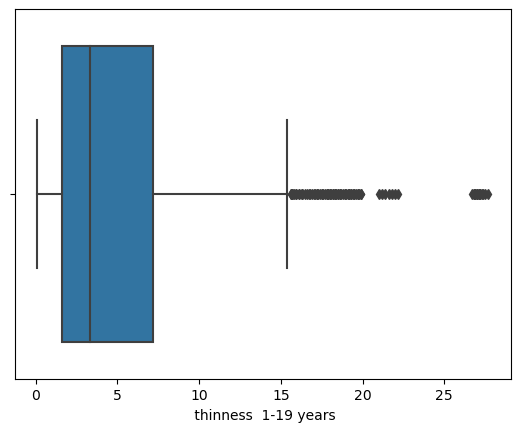

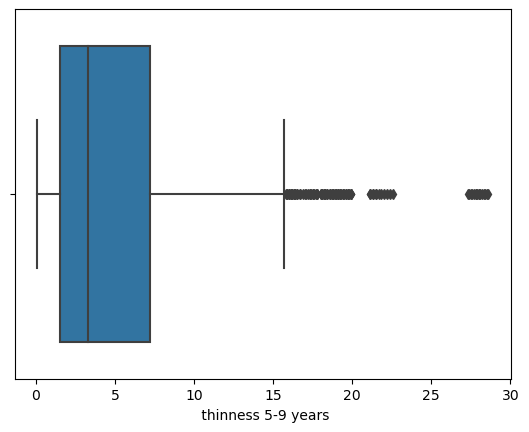

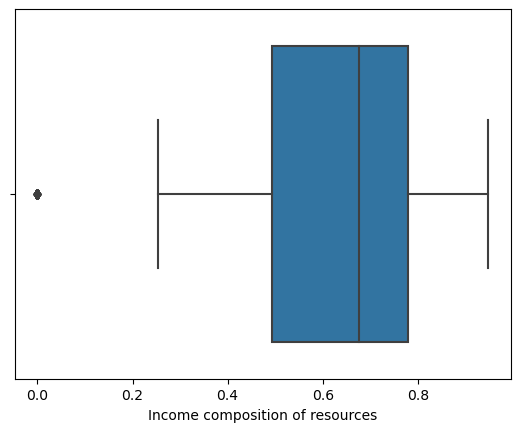

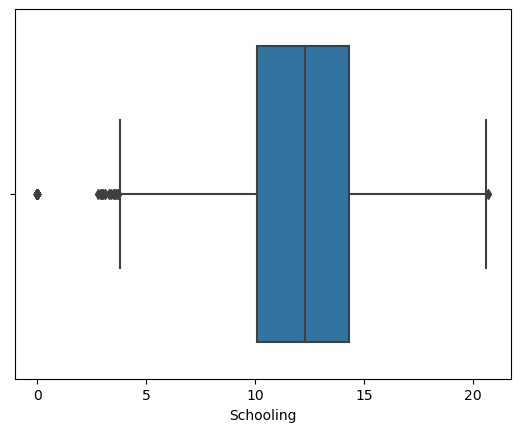

In [16]:
for i in data:
    sns.boxplot(x=data[i])
    plt.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """Entry point for launching an IPython kernel.


<AxesSubplot:xlabel='Schooling'>

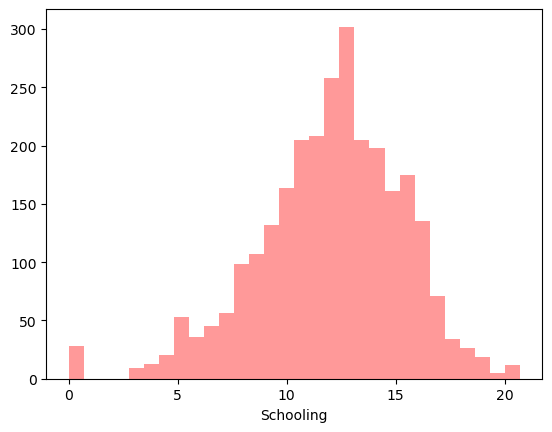

In [17]:
sns.distplot(data['Schooling'],kde = False, color ='red', bins = 30)

In [18]:
y_inp = d[2]
y_inp

0       1.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
2933    1.0
2934    1.0
2935    1.0
2936    1.0
2937    1.0
Name: 2, Length: 2938, dtype: float64

In [19]:
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       2938 non-null   float64
 1   1       2938 non-null   float64
 2   2       2938 non-null   float64
 3   3       2938 non-null   float64
 4   4       2938 non-null   float64
 5   5       2938 non-null   float64
 6   6       2938 non-null   float64
 7   7       2938 non-null   float64
 8   8       2938 non-null   float64
 9   9       2938 non-null   float64
 10  10      2938 non-null   float64
 11  11      2938 non-null   float64
 12  12      2938 non-null   float64
 13  13      2938 non-null   float64
 14  14      2938 non-null   float64
 15  15      2938 non-null   float64
 16  16      2938 non-null   float64
 17  17      2938 non-null   float64
 18  18      2938 non-null   float64
 19  19      2938 non-null   float64
 20  20      2938 non-null   float64
 21  21      2938 non-null   float64
dtype

In [20]:
x_inp = d.drop([2],axis=1)
x_inp

,0,1,3,4,5,6,7,8,9,10,...,12,13,14,15,16,17,18,19,20,21
0,0.0,2015.0,65.0,263.0,62.0,0.01,71.279624,65.0,1154.0,19.1,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,0.0,2014.0,59.9,271.0,64.0,0.01,73.523582,62.0,492.0,18.6,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,0.0,2013.0,59.9,268.0,66.0,0.01,73.219243,64.0,430.0,18.1,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,0.0,2012.0,59.5,272.0,69.0,0.01,78.184215,67.0,2787.0,17.6,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,0.0,2011.0,59.2,275.0,71.0,0.01,7.097109,68.0,3013.0,17.2,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,192.0,2004.0,44.3,723.0,27.0,4.36,0.000000,68.0,31.0,27.1,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,192.0,2003.0,44.5,715.0,26.0,4.06,0.000000,7.0,998.0,26.7,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,192.0,2002.0,44.8,73.0,25.0,4.43,0.000000,73.0,304.0,26.3,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,192.0,2001.0,45.3,686.0,25.0,1.72,0.000000,76.0,529.0,25.9,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


**normalization**

In [21]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
norm = MinMaxScaler()
x_inp.dropna(axis=1,inplace = True)
norm_data = norm.fit_transform(x_inp)
x_inp = pd.DataFrame(norm_data,columns = x_inp.columns)
x_inp

,0,1,3,4,5,6,7,8,9,10,...,12,13,14,15,16,17,18,19,20,21
0,0.0,1.000000,0.544592,0.362881,0.034444,0.000000,0.003659,0.653061,0.005439,0.209733,...,0.031250,0.452118,0.649485,0.000000,0.004889,0.026074,0.619565,0.603509,0.505274,0.487923
1,0.0,0.933333,0.447818,0.373961,0.035556,0.000000,0.003774,0.622449,0.002319,0.203940,...,0.572917,0.453279,0.618557,0.000000,0.005127,0.000253,0.630435,0.610526,0.502110,0.483092
2,0.0,0.866667,0.447818,0.369806,0.036667,0.000000,0.003759,0.642857,0.002027,0.198146,...,0.614583,0.450377,0.639175,0.000000,0.005287,0.024525,0.637681,0.617544,0.495781,0.478261
3,0.0,0.800000,0.440228,0.375346,0.038333,0.000000,0.004014,0.673469,0.013135,0.192352,...,0.666667,0.473012,0.670103,0.000000,0.005608,0.002857,0.644928,0.628070,0.488397,0.473430
4,0.0,0.733333,0.434535,0.379501,0.039444,0.000000,0.000364,0.683673,0.014200,0.187717,...,0.677083,0.435287,0.680412,0.000000,0.000519,0.002302,0.655797,0.635088,0.478903,0.458937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,1.0,0.266667,0.151803,1.000000,0.015000,0.243561,0.000000,0.683673,0.000146,0.302433,...,0.666667,0.392339,0.649485,0.663366,0.003799,0.009875,0.336957,0.326316,0.429325,0.444444
2934,1.0,0.200000,0.155598,0.988920,0.014444,0.226764,0.000000,0.061224,0.004703,0.297798,...,0.041667,0.356936,0.680412,0.724752,0.003790,0.009764,0.351449,0.343860,0.440928,0.458937
2935,1.0,0.133333,0.161290,0.099723,0.013889,0.247480,0.000000,0.734694,0.001433,0.293163,...,0.729167,0.357516,0.711340,0.786139,0.000467,0.000097,0.039855,0.042105,0.450422,0.483092
2936,1.0,0.066667,0.170778,0.948753,0.013889,0.095745,0.000000,0.765306,0.002493,0.288528,...,0.760417,0.336042,0.752577,0.831683,0.004589,0.009558,0.054348,0.056140,0.450422,0.473430


<AxesSubplot:>

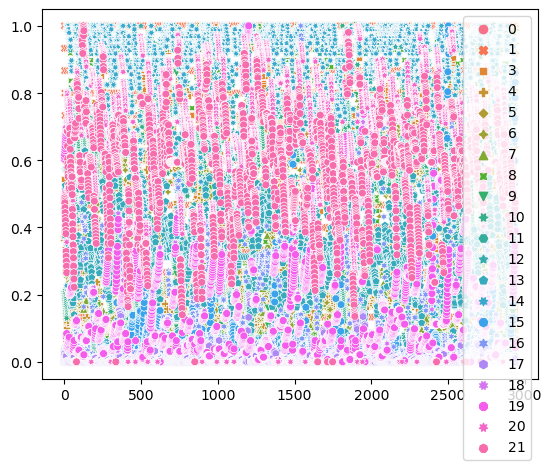

In [22]:
import seaborn as sns
sns.scatterplot(x_inp)


In [23]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_inp,y_inp,test_size = 0.2,random_state = 1)

In [24]:
x_train.shape

(2350, 21)

In [25]:
X_set, y_set = x_train, y_train

In [26]:
from mpl_toolkits.mplot3d import Axes3D  

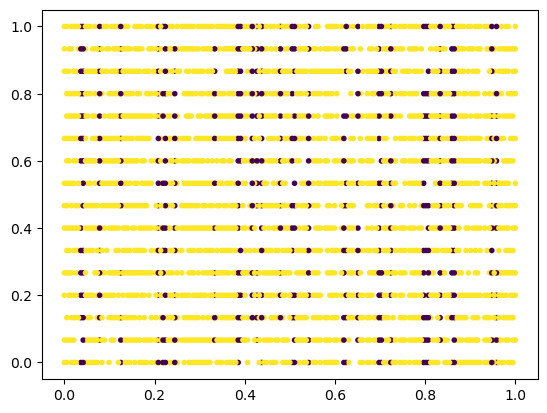

In [27]:
# visualizing data
plt.scatter(x_train.iloc[:, 0], x_train.iloc[:, 1], c = y_train, marker = '.')
plt.show()

**SVM**

In [28]:
from sklearn.svm import SVC
svm_classifier = SVC(kernel='linear',C=0.1)

In [29]:
svm_classifier.fit(x_train,y_train)

SVC(C=0.1, kernel='linear')

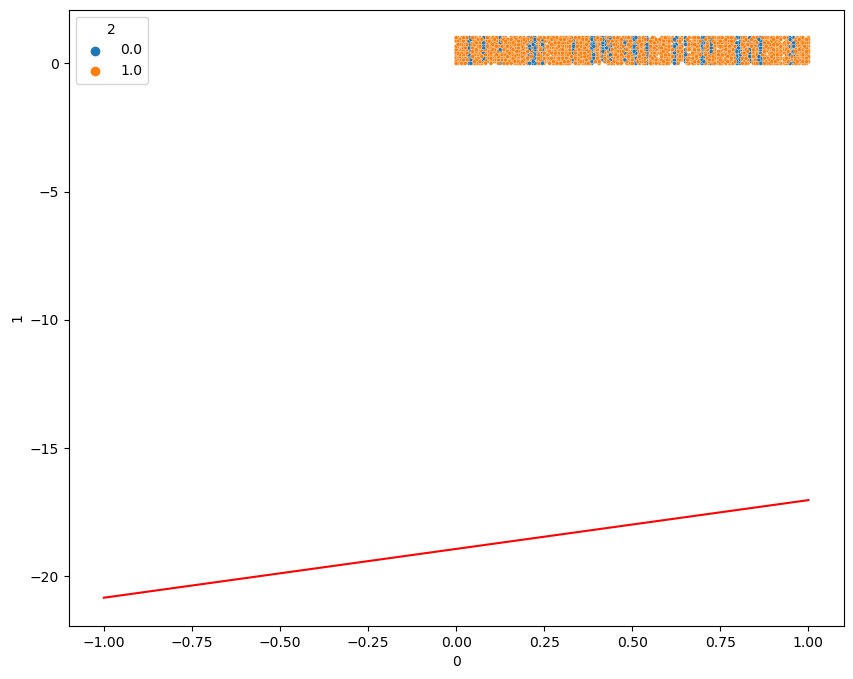

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 8))
# Plotting our two-features-space
sns.scatterplot(x=x_train.iloc[:, 0], 
                y=x_train.iloc[:, 1], 
                hue=y_train, 
                s=8);
# Constructing a hyperplane using a formula.
w = svm_classifier.coef_[0]           # w consists of 2 elements
b = svm_classifier.intercept_[0]      # b consists of 1 element
x_points = np.linspace(-1, 1)    # generating x-points from -1 to 1
y_points = -(w[0] / w[1]) * x_points - b / w[1]  # getting corresponding y-points
# Plotting a red hyperplane
plt.plot(x_points, y_points, c='r');

In [31]:
svm_classifier.score(x_train,y_train)

0.9357446808510639

In [32]:
svm_classifier.score(x_test,y_test)

0.9421768707482994